#**대회 소개**
#### Kaggle의 플레이그라운드의 주제는 분류 문제입니다.
####이 대회는 말의 건강 기록을 기반으로 말이 살지, 죽을지, 아니면 안락사를 할지 예측하는 것이 목표입니다.
####제출 평가는 micro-averaged F1-Score로 진행됩니다.

#**라이브러리와 데이터셋 로드**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from category_encoders import OneHotEncoder, GLMMEncoder, TargetEncoder, CatBoostEncoder
from sklearn import set_config
from sklearn.inspection import permutation_importance
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, clone
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import HistGradientBoostingClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

sns.set_theme(style = 'white', palette = 'viridis')
pal = sns.color_palette('viridis')

pd.set_option('display.max_rows', 100)
set_config(transform_output = 'pandas')
pd.options.mode.chained_assignment = None


In [2]:
from google.colab import drive
drive.mount("/content/drive")

train = pd.read_csv('/content/drive/MyDrive/playground-series-s3e22/train.csv', index_col = 'id')
test = pd.read_csv('/content/drive/MyDrive/playground-series-s3e22/test.csv', index_col = 'id')
orig_train = pd.read_csv('/content/drive/MyDrive/playground-series-s3e22/horse.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#**데이터셋 통계**
## <데이터셋 변수 종류 요약>
#### surgery = 수술
#### age = 나이
#### hospital_number = 병원 고유번호
#### pulse = 맥박 (대동맥에서 측정)
#### rectal_temp = 직장 체온 (동물 항문의 온도 측정)
#### respiratory_rate = 호흡 속도
#### temp_of_extremities = 사지 체온 (손, 발, 겨드랑이 같은 바깥부분 온도 측정)
#### peripheral_pulse = 말초맥박 (신체의 말단 부분에서 측정)
#### mocous_membrane = 점막
#### capillary_refill_time = 모세혈관 재충전 시간
#### packed_cell_volume = 적혈구 용적 백분율
#### total_protein = 총 단백질 양
#### abdomo_appearance = 복부 모양
#### abdomo_protein = 복부 단백질 양
#### surgical_lesion = 수술 상처 또는 손상
#### lesion_1 = 상처 종류 1
#### lesion_2 = 상처 종류 2
#### lesion_3 = 상처 종류 3
#### cp_data = 임상 실무 데이터
#### outcome = 결과



In [3]:
train.head(10)

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome
id,,,,,,,,,,,,,,,,,,,,,
0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,...,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,died
1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,...,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,euthanized
2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,...,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,lived
3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,...,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,lived
4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,...,47.0,7.3,cloudy,2.6,no,0,0,0,yes,lived
5,no,adult,529642,38.1,56.0,32.0,normal,normal,bright_pink,less_3_sec,...,49.0,8.0,cloudy,2.8,no,0,0,0,yes,lived
6,yes,adult,534787,38.3,36.0,16.0,cool,reduced,normal_pink,less_3_sec,...,43.0,75.0,cloudy,1.0,no,3111,0,0,yes,euthanized
7,no,adult,529461,39.2,114.0,24.0,cool,reduced,pale_cyanotic,more_3_sec,...,57.0,7.6,serosanguious,4.5,yes,2207,0,0,yes,died
8,no,adult,528742,37.4,48.0,12.0,cool,reduced,normal_pink,less_3_sec,...,40.0,7.8,cloudy,2.6,no,0,0,0,yes,lived


In [4]:
desc = pd.DataFrame(index = list(train))

#count를 사용하여 각 변수별 데이터 수 확인
desc['count'] = train.count()

#nunique을 사용하여 각 변수별 고유 데이터 종류 수 확인
desc['nunique'] = train.nunique()

#고유 데이터 종류 수의 비율 확인
desc['%unique'] = desc['nunique'] / len(train) * 100

#데이터에 Null이 있는지 확인
desc['null'] = train.isnull().sum()

#데이터 변수의 속성 확인
desc['type'] = train.dtypes

#데이터의 표준편차, 최소값, 25%, 50%, 75%, 최대값 확인
desc = pd.concat([desc, train.describe().T], axis = 1)

desc

,count,nunique,%unique,null,type,count,mean,std,min,25%,50%,75%,max
surgery,1235,2,0.161943,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,1235,2,0.161943,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hospital_number,1235,255,20.647773,0,int64,1235.0,954500.401619,1.356403e+06,521399.0,528800.0,529777.0,534145.0,5305129.0
rectal_temp,1235,43,3.481781,0,float64,1235.0,38.202186,7.886678e-01,35.4,37.8,38.2,38.6,40.8
pulse,1235,50,4.048583,0,float64,1235.0,79.574089,2.910864e+01,30.0,53.0,76.0,100.0,184.0
respiratory_rate,1235,37,2.995951,0,float64,1235.0,30.054251,1.645207e+01,8.0,18.0,28.0,36.0,96.0
temp_of_extremities,1235,5,0.404858,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
peripheral_pulse,1235,5,0.404858,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mucous_membrane,1235,7,0.566802,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
capillary_refill_time,1235,4,0.323887,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#위와 동일하게 orig_train에도 적용

desc = pd.DataFrame(index = list(orig_train))
desc['count'] = orig_train.count()
desc['nunique'] = orig_train.nunique()
desc['%unique'] = desc['nunique'] / len(orig_train) * 100
desc['null'] = orig_train.isnull().sum()
desc['type'] = orig_train.dtypes
desc = pd.concat([desc, orig_train.describe().T], axis = 1)
desc

,count,nunique,%unique,null,type,count,mean,std,min,25%,50%,75%,max
surgery,299,2,0.668896,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,299,2,0.668896,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hospital_number,299,283,94.648829,0,int64,299.0,1.087733e+06,1.532032e+06,518476.0,528904.0,530301.0,534736.00,5305629.0
rectal_temp,239,40,13.377926,60,float64,239.0,3.816862e+01,7.337444e-01,35.4,37.8,38.2,38.50,40.8
pulse,275,52,17.391304,24,float64,275.0,7.200000e+01,2.864622e+01,30.0,48.0,64.0,88.00,184.0
respiratory_rate,241,40,13.377926,58,float64,241.0,3.046058e+01,1.766610e+01,8.0,18.0,25.0,36.00,96.0
temp_of_extremities,243,4,1.337793,56,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
peripheral_pulse,230,4,1.337793,69,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mucous_membrane,252,6,2.006689,47,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
capillary_refill_time,267,3,1.003344,32,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
test.head(10)

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
id,,,,,,,,,,,,,,,,,,,,,
1235,no,adult,534053,38.6,40.0,20.0,normal,normal,normal_pink,less_3_sec,...,distend_small,42.0,7.5,clear,2.3,no,0,0,0,no
1236,yes,adult,528469,38.2,112.0,48.0,cool,reduced,bright_pink,more_3_sec,...,distend_small,44.0,6.0,serosanguious,2.6,no,2208,0,0,yes
1237,yes,adult,528178,37.7,66.0,12.0,cool,normal,bright_red,less_3_sec,...,distend_small,31.5,6.0,cloudy,1.6,yes,2205,0,0,yes
1238,no,adult,534784,37.1,88.0,20.0,cool,reduced,pale_cyanotic,less_3_sec,...,distend_large,75.0,81.0,None,1.0,yes,1400,0,0,no
1239,yes,adult,529840,38.3,50.0,12.0,None,normal,bright_pink,less_3_sec,...,distend_small,37.0,6.8,cloudy,2.6,yes,2208,0,0,yes
1240,yes,adult,530239,38.5,104.0,36.0,cool,normal,bright_red,more_3_sec,...,distend_small,69.0,8.9,serosanguious,6.0,yes,2207,0,0,yes
1241,yes,adult,528548,40.8,114.0,36.0,cold,reduced,dark_cyanotic,more_3_sec,...,distend_small,40.0,8.6,serosanguious,2.6,yes,2209,0,0,yes
1242,no,young,528503,40.3,114.0,36.0,cool,reduced,pale_cyanotic,more_3_sec,...,None,48.0,7.0,serosanguious,2.8,yes,2209,0,0,yes
1243,yes,adult,5287179,38.3,66.0,12.0,cool,reduced,pale_pink,less_3_sec,...,distend_large,39.0,6.0,serosanguious,3.4,yes,4205,0,0,no


In [7]:
desc = pd.DataFrame(index = list(test))
desc['count'] = test.count()
desc['nunique'] = test.nunique()
desc['%unique'] = desc['nunique'] / len(test) * 100
desc['null'] = test.isnull().sum()
desc['type'] = test.dtypes
desc = pd.concat([desc, test.describe().T], axis = 1)
desc

,count,nunique,%unique,null,type,count,mean,std,min,25%,50%,75%,max
surgery,824,2,0.242718,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,824,2,0.242718,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hospital_number,824,210,25.485437,0,int64,824.0,1.108357e+06,1.555627e+06,521399.0,528743.0,529808.5,534644.0,5305129.0
rectal_temp,824,34,4.126214,0,float64,824.0,3.824454e+01,7.852339e-01,36.0,37.8,38.2,38.6,40.8
pulse,824,49,5.946602,0,float64,824.0,8.022937e+01,2.916471e+01,36.0,54.0,76.0,100.0,184.0
respiratory_rate,824,38,4.611650,0,float64,824.0,3.071966e+01,1.743191e+01,9.0,18.0,28.0,36.0,96.0
temp_of_extremities,824,5,0.606796,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
peripheral_pulse,824,5,0.606796,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mucous_membrane,824,7,0.849515,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
capillary_refill_time,824,4,0.485437,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
#test 데이터에서의 lesion_3는 모든 값이 0이므로, numerical features와 categoricla feastures에서 drop을 했습니다.
numerical_features = test._get_numeric_data().drop('lesion_3', axis = 1).columns
categorical_features = test.drop(numerical_features, axis = 1).drop('lesion_3', axis = 1).columns

#Adversarial Validation (적대적 검증)
#### 적대적 검증의 목적은 Train 데이터셋과 Test 데이터셋의 분포가 비슷한지 확인하는 것이 목적입니다.만약 ROC-AUC 점수가 0.5에 가까워진다면, 2개의 데이터셋은 매우 비슷하다고 할 수 있습니다. 하지만 측정치가 0.5에서부터 멀어진다면, 2개의 데이터셋의 분포가 비슷하지 않습니다.


In [9]:
def adversarial_validation(dataset_1 = train, dataset_2 = test, label = 'Train-Test'):

    adv_train = dataset_1.drop('outcome', axis = 1)  #train 데이터의 outcome (결과)를 drop합니다.
    adv_test = dataset_2.copy()

    adv_train['is_test'] = 0
    adv_test['is_test'] = 1

    adv = pd.concat([adv_train, adv_test], ignore_index = True)  #pd.concat()은 데이터프레임을 특정 방향으로 이어붙이는 함수입니다.

    adv_shuffled = adv.sample(frac = 1)

    adv_X = adv_shuffled.drop('is_test', axis = 1)
    adv_y = adv_shuffled.is_test

    skf = StratifiedKFold(n_splits = 5, random_state = 42, shuffle = True) #Stratified KFold() = 불균형한 분포도를 가진 레이블 데이터 집합을 위한 KFold 방식

    val_scores = []
    predictions = np.zeros(len(adv))

    for fold, (train_idx, val_idx) in enumerate(skf.split(adv_X, adv_y)):

        adv_lr = make_pipeline(OneHotEncoder(cols = categorical_features), XGBClassifier(random_state = 42))
        adv_lr.fit(adv_X.iloc[train_idx], adv_y.iloc[train_idx])

        val_preds = adv_lr.predict_proba(adv_X.iloc[val_idx])[:,1]
        predictions[val_idx] = val_preds
        val_score = roc_auc_score(adv_y.iloc[val_idx], val_preds)
        val_scores.append(val_score)

    fpr, tpr, _ = roc_curve(adv['is_test'], predictions)

    #데이터로 나타내기

    plt.figure(figsize = (10, 10), dpi = 300)
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle="--", label="Indistinguishable Datasets")
    sns.lineplot(x=fpr, y=tpr, label="Adversarial Validation Classifier")
    plt.title(f'{label} Validation = {np.mean(val_scores):.5f}', weight = 'bold', size = 17)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

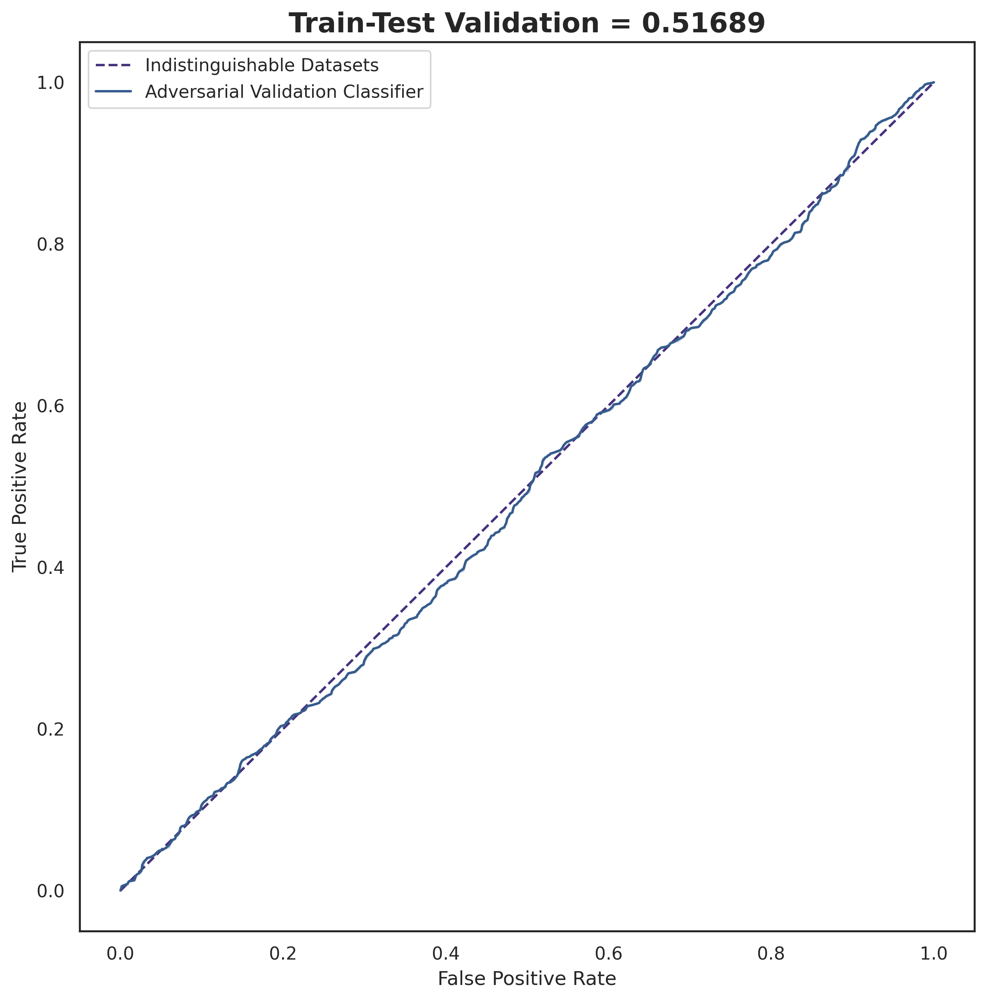

In [10]:
adversarial_validation()

###Train-Test Validation은 0.51584로, 0.5에 가깝기 때문에, Train 데이터와 Test 데이터는 비슷하다고 할 수 있습니다.

#Numerical Features의 분포
#### Train, Test, Original Train에서의 수치형 features를 분리하여 분포를 그래프로 나타냈습니다.

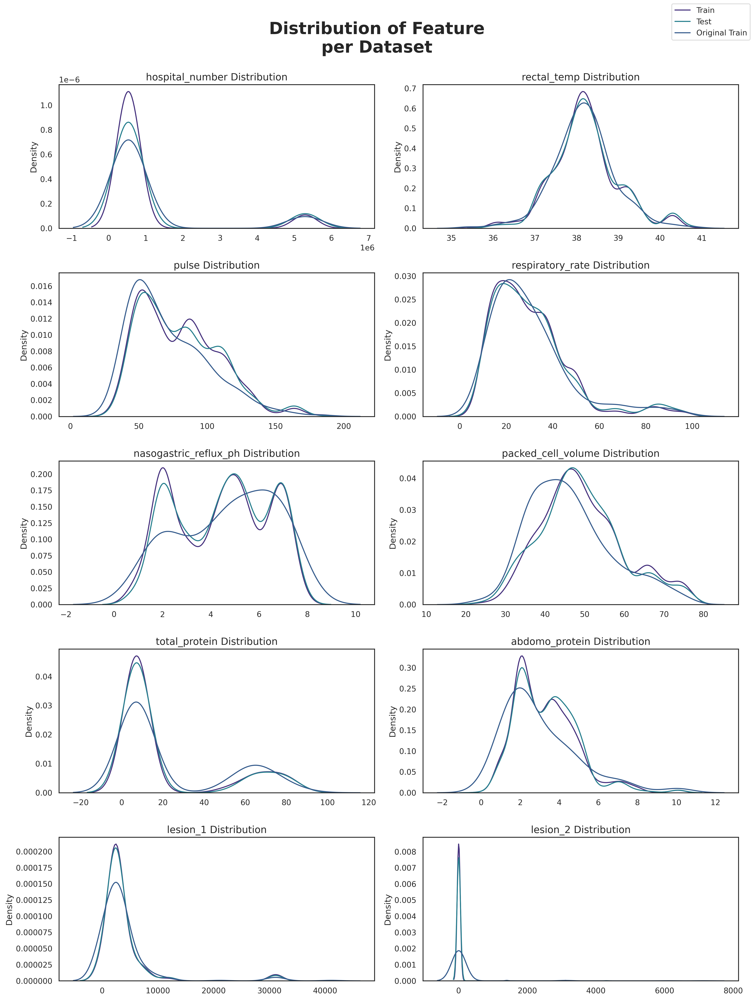

In [11]:
fig, ax = plt.subplots(5, 2, figsize = (15, 20), dpi = 300)
ax = ax.flatten()

for i, column in enumerate(numerical_features):

    if i == 11:
        break

    sns.kdeplot(train[column], ax=ax[i], color=pal[0])
    sns.kdeplot(test[column], ax=ax[i], color=pal[2], warn_singular = False)
    sns.kdeplot(orig_train[column], ax=ax[i], color=pal[1])

    ax[i].set_title(f'{column} Distribution', size = 14)
    ax[i].set_xlabel(None)

fig.suptitle('Distribution of Feature\nper Dataset\n', fontsize = 24, fontweight = 'bold')
fig.legend(['Train', 'Test', 'Original Train'])
plt.tight_layout()

#Categorical Features의 분포
#### Train, Test, Original Train에서의 카테고리 features를 분리하여 통계로 나타냈습니다.

## Train에서의 Categorical Features의 분포

In [12]:
fig, ax = plt.subplots(16, 2, figsize = (16, 80), dpi = 300)

for i, column in enumerate(categorical_features):

    ax[i][0].pie(
        train[column].value_counts(),
        shadow = True,
        explode = [.1 for i in range(train[column].nunique())],
        autopct = '%1.f%%',
        textprops = {'size' : 14, 'color' : 'white'}
    )

    sns.countplot(data = train, y = column, ax = ax[i][1], palette = 'viridis', order = train[column].value_counts().index)
    ax[i][1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 12)
    ax[i][1].set_xlabel('Count in Train', fontsize = 15)
    ax[i][1].set_ylabel(f'{column}', fontsize = 15)
    plt.xticks(fontsize = 12)

fig.suptitle('Distribution of Categorical Features\nin Train Dataset\n\n\n\n', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

## Test에서의 Categorical Features의 분포

In [13]:
fig, ax = plt.subplots(16, 2, figsize = (16, 80), dpi = 300)

for i, column in enumerate(categorical_features):

    ax[i][0].pie(
        test[column].value_counts(),
        shadow = True,
        explode = [.1 for i in range(test[column].nunique())],
        autopct = '%1.f%%',
        textprops = {'size' : 14, 'color' : 'white'}
    )

    sns.countplot(data = test, y = column, ax = ax[i][1], palette = 'viridis', order = test[column].value_counts().index)
    ax[i][1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 12)
    ax[i][1].set_xlabel('Count in Test', fontsize = 15)
    ax[i][1].set_ylabel(f'{column}', fontsize = 15)
    plt.xticks(fontsize = 12)

fig.suptitle('Distribution of Categorical Features\nin Test Dataset\n\n\n\n', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

##데이터를 통해서 알게 된 점
#### 대부분의 말은 어른이고 수술을 하였다.

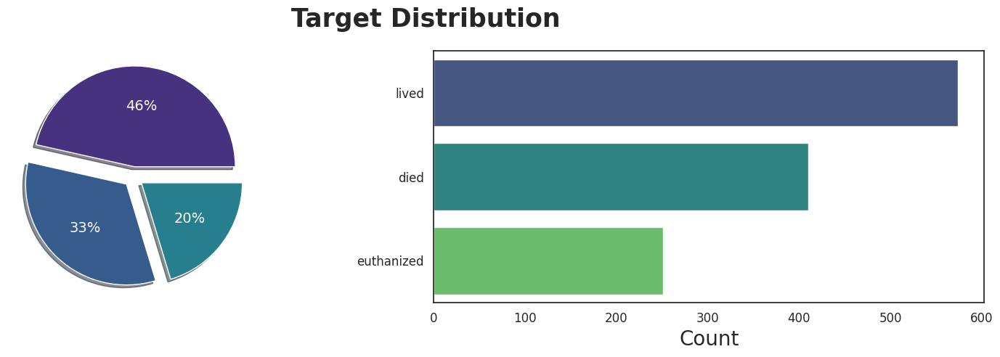

In [14]:
fig, ax = plt.subplots(1, 2, figsize = (16, 5))
ax = ax.flatten()

ax[0].pie(
    train['outcome'].value_counts(),
    shadow = True,
    explode = [.1 for i in range(train.outcome.nunique())],
    autopct = '%1.f%%',
    textprops = {'size' : 14, 'color' : 'white'}
)

sns.countplot(data = train, y = 'outcome', ax = ax[1], palette = 'viridis', order = train['outcome'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 20)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('Target Distribution', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

#### 53%의 말은 죽었다. (안락사 또는 죽음)
#### 46%의 말은 살고있다.

#Metrics
### F1 = 2(Precision x Recall) / (Precision + Recall) = 2tp/(2tp + fp + fn)
#### tp = TruePositive
#### fp = FalsePositive
#### fn = FalseNegative

In [15]:
#f1_score 함수
def f1(y_true, y_pred):
    return f1_score(y_true, y_pred, average = 'micro')

# 전처리
#### lesion_3에는 고유값 (0)이 1개이므로, test 데이터에서 lesion_3의 값이 다른 행을 지우고, feature를 drop하여 간단하게 해줍니다.

In [16]:
preprocessed_train = train[train.lesion_3 == 0].drop('lesion_3', axis = 1)
preprocessed_test = test.drop('lesion_3', axis = 1)
preprocessed_orig_train = orig_train[orig_train.lesion_3 == 0].drop('lesion_3', axis = 1)

In [17]:
X = pd.concat([preprocessed_train, preprocessed_orig_train])
y = X.pop('outcome')

y_map = {k : v for v, k in enumerate(train.outcome.unique())}
y_reverse_map = {v : k for k, v in y_map.items()}

y = y.map(y_map)

f1_scorer = make_scorer(f1)

seed = 42
splits = 5
repeats = 4
rskf = RepeatedStratifiedKFold(n_splits = splits, random_state = seed, n_repeats = repeats)
skf = StratifiedKFold(n_splits = splits, random_state = seed, shuffle = True)
np.random.seed(seed)

# 모델
#### One Hot Encoder를 사용하여 categorical features를 encode합니다.

In [18]:
def cross_val_score(estimator, cv = rskf, label = '', include_original = False):

    X = preprocessed_train.copy()
    y = X.pop('outcome')

    y = y.map(y_map)

    #initiate prediction arrays and score lists
    val_predictions = np.zeros((len(X)))
    #train_predictions = np.zeros((len(sample)))
    train_scores, val_scores = [], []

    #training model, predicting prognosis probability, and evaluating metrics
    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):

        model = clone(estimator)

        #define train set
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]

        #define validation set
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]

        if include_original:
            X_train = pd.concat([X_train, preprocessed_orig_train.drop('outcome', axis = 1)])
            y_train = pd.concat([y_train, preprocessed_orig_train.outcome.map(y_map)])

        #train model
        model.fit(X_train, y_train)

        #make predictions
        train_preds = model.predict(X_train)
        val_preds = model.predict(X_val)

        #val_predictions[val_idx] += val_preds / repeats

        #evaluate model for a fold
        train_score = f1(y_train, train_preds)
        val_score = f1(y_val, val_preds)

        #append model score for a fold to list
        train_scores.append(train_score)
        val_scores.append(val_score)

    print(f'Val Score: {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} | Train Score: {np.mean(train_scores):.5f} ± {np.std(train_scores):.5f} | {label}')

    return val_scores, val_predictions

# 모델 평가

In [20]:
score_list, oof_list = pd.DataFrame(), pd.DataFrame()

models = [
    ('log', LogisticRegression(random_state = seed, max_iter = 1000000)),
    ('svc', SVC(random_state = seed, probability = True)),
    ('lda', LinearDiscriminantAnalysis()),
    ('qda', QuadraticDiscriminantAnalysis()),
    ('gauss', GaussianProcessClassifier(random_state = seed)),
    ('rf', RandomForestClassifier(random_state = seed)),
    ('et', ExtraTreesClassifier(random_state = seed)),
    ('xgb', XGBClassifier(random_state = seed)),
    ('lgb', LGBMClassifier(random_state = seed)),
    ('dart', LGBMClassifier(random_state = seed, boosting_type = 'dart')),
    ('cb', CatBoostClassifier(random_state = seed, verbose = 0)),
    ('gb', GradientBoostingClassifier(random_state = seed)),
    ('hgb', HistGradientBoostingClassifier(random_state = seed)),
]

for (label, model) in models:
    score_list[label], _ = cross_val_score(
        make_pipeline(OneHotEncoder(cols = categorical_features), SimpleImputer(), model),
        label = label,
        include_original = True
    )

Val Score: 0.46610 ± 0.05344 | Train Score: 0.49109 ± 0.05335 | log
Val Score: 0.47932 ± 0.01384 | Train Score: 0.50358 ± 0.00266 | svc
Val Score: 0.68045 ± 0.02162 | Train Score: 0.72547 ± 0.00676 | lda


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/disc

Val Score: 0.39022 ± 0.09033 | Train Score: 0.43672 ± 0.11695 | qda
Val Score: 0.51622 ± 0.01196 | Train Score: 1.00000 ± 0.00000 | gauss
Val Score: 0.71777 ± 0.02371 | Train Score: 1.00000 ± 0.00000 | rf
Val Score: 0.70215 ± 0.02218 | Train Score: 1.00000 ± 0.00000 | et
Val Score: 0.72546 ± 0.02524 | Train Score: 1.00000 ± 0.00000 | xgb
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 740
[LightGBM] [Info] Number of data points in the train set: 1284, number of used features: 82
[LightGBM] [Info] Start training from score -1.153848
[LightGBM] [Info] Start training from score -1.660567
[LightGBM] [Info] Start training from score -0.704110
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to 

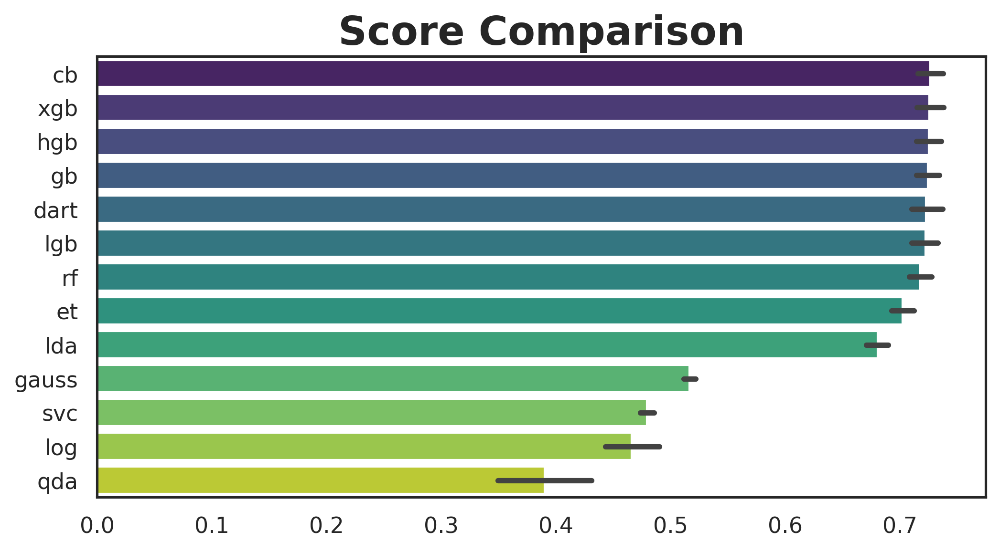

In [21]:
plt.figure(figsize = (8, 4), dpi = 300)
sns.barplot(data = score_list.reindex((-1 * score_list).mean().sort_values().index, axis = 1), palette = 'viridis', orient = 'h')
plt.title('Score Comparison', weight = 'bold', size = 20)
plt.show()

## 모델 평가를 하였을때, **Catboost** 모델의 점수가 가장 높습니다.

# Catboost 모델
#### Boosting 기반의 모델입니다. Boosting 기반은 약한 분류기들을 결합하여 더 강한 분류기를 만듭니다. 예측값의 bias를 작게 만들게 합니다.
#### 단점은 bias를 작게하는만큼, variance가 커져 오버피팅이 될 수 있는 위험을 가지고 있습니다.

#제출

In [22]:
model = make_pipeline(OneHotEncoder(cols = categorical_features), SimpleImputer(), CatBoostClassifier(random_state = seed, verbose = 0))

model.fit(X, y)
submission = preprocessed_test.copy()
submission['outcome'] = model.predict(submission)
submission.outcome = submission.outcome.map(y_reverse_map)

In [23]:
submission.outcome.to_csv('submission.csv')